In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import os
import numpy as np
%matplotlib inline

In [5]:
#mashresults
mashdic = {}
for i in os.listdir('mashresults'):
    dataset = i.strip().split('.')[0]
    with open('mashresults/'+ i) as f:
        for line in f:
            cdd = line.strip().split('.')[0]
            contig = '_'.join(line.strip().split()[1].split('_')[:-1])
            pval = float(line.strip().split()[3])
            if dataset in mashdic:
                if cdd not in mashdic[dataset]:
                    mashdic[dataset].append(cdd)
            if dataset not in mashdic:
                mashdic[dataset] = [cdd]

In [6]:
mashdic

{'SRR5106395': ['pfam02956',
  'pfam05311',
  'PHA03233',
  'PHA03322',
  'PHA03385',
  'pfam04513',
  'PHA02555',
  'pfam02957',
  'pfam04523',
  'pfam04623',
  'PHA00452',
  'PHA02553',
  'PHA02616',
  'PHA03346',
  'PHA03362',
  'pfam05268',
  'PHA03232',
  'PHA03293',
  'PHA03415',
  'pfam01499',
  'pfam03117',
  'pfam04559',
  'pfam11081',
  'PHA03166',
  'PHA03178',
  'PHA03248',
  'PHA03252',
  'PHA03343',
  'PHA03368',
  'PHA03369',
  'pfam03014',
  'PHA03307',
  'PHA03359',
  'TIGR04236',
  'PHA03140',
  'PHA02605',
  'PHA03292',
  'PHA03348',
  'PHA00661',
  'pfam01366',
  'pfam04797',
  'PHA00684',
  'PHA01399',
  'PHA03144',
  'PHA03247',
  'PHA03261',
  'PHA03365',
  'pfam05718',
  'PHA02664',
  'PHA03278',
  'pfam00747',
  'pfam03327',
  'pfam05518',
  'PHA03249',
  'PHA03263',
  'PHA03367',
  'PHA02685',
  'TIGR04233',
  'pfam01601',
  'pfam03064',
  'pfam01621',
  'pfam01538',
  'pfam01673',
  'pfam03337',
  'pfam03910',
  'pfam06016',
  'pfam06284',
  'PHA00727',
  'PH

In [7]:
#get pssm id and wrap them around to actual accessions:
linkdic = {}
with open('virus_models.txt') as f:
    for line in f:
        acc1 = line.strip().split(' ')[0]
        pssmacc = line.strip().split()[2]
        linkdic[pssmacc] = acc1
linkdic

{'222768': 'PHA00002',
 '222769': 'PHA00003',
 '164773': 'PHA00006',
 '164774': 'PHA00007',
 '222770': 'PHA00008',
 '164775': 'PHA00009',
 '164776': 'PHA00010',
 '222771': 'PHA00012',
 '222772': 'PHA00019',
 '164777': 'PHA00022',
 '106880': 'PHA00024',
 '222773': 'PHA00025',
 '133846': 'PHA00026',
 '133847': 'PHA00027',
 '222774': 'PHA00028',
 '222775': 'PHA00080',
 '106886': 'PHA00094',
 '164779': 'PHA00097',
 '222776': 'PHA00098',
 '164781': 'PHA00099',
 '177266': 'PHA00101',
 '222777': 'PHA00144',
 '133855': 'PHA00147',
 '222778': 'PHA00148',
 '222779': 'PHA00149',
 '177267': 'PHA00159',
 '222780': 'PHA00198',
 '177268': 'PHA00201',
 '164786': 'PHA00202',
 '164787': 'PHA00212',
 '222781': 'PHA00276',
 '106901': 'PHA00280',
 '164789': 'PHA00327',
 '222782': 'PHA00330',
 '222783': 'PHA00350',
 '177271': 'PHA00360',
 '222784': 'PHA00363',
 '222785': 'PHA00368',
 '164794': 'PHA00369',
 '164795': 'PHA00370',
 '222786': 'PHA00371',
 '133872': 'PHA00380',
 '164796': 'PHA00404',
 '222787': 

In [8]:
#rpsblastresults
rpsdic = {}
for i in os.listdir('realrpsresults'):
    dataset = i.strip().split('.')[0]
    with open('realrpsresults/' + i) as f:
        for line in f:
            accfull = line.strip().split()[1].replace('CDD:','')
            if accfull in linkdic:
                realacc = linkdic[accfull]
            else:
                realacc = 'NA'
            if dataset in rpsdic:
                rpsdic[dataset].append(realacc)
            else:
                rpsdic[dataset] = [realacc]

In [9]:
rpsdic

{'SRR7688719': ['pfam01528',
  'PHA03388',
  'PHA03202',
  'PHA02592',
  'PHA02592',
  'PHA02592',
  'PHA02592',
  'PHA03132',
  'PHA03225',
  'PHA03132',
  'pfam04913',
  'pfam05788',
  'PHA02569',
  'PHA02569',
  'PHA02569',
  'PHA02569',
  'PHA02569',
  'pfam00979',
  'pfam05579',
  'PHA03011',
  'pfam05579',
  'PHA03265',
  'PHA02778',
  'PHA02778',
  'PHA02778',
  'PHA02778',
  'PHA02778',
  'PHA02778',
  'PHA02778',
  'PHA02778',
  'PHA00202',
  'pfam05748',
  'pfam07415',
  'pfam07415',
  'PHA02778',
  'PHA02518',
  'pfam03340',
  'PHA02518',
  'pfam00519',
  'pfam00519',
  'pfam00519',
  'pfam00519',
  'pfam00519',
  'pfam00519',
  'pfam00519',
  'pfam00519',
  'pfam04947',
  'pfam01763',
  'pfam00519',
  'pfam00519',
  'pfam01763',
  'PHA02776',
  'PHA02776',
  'PHA02776',
  'PHA02776',
  'pfam02477',
  'PHA00368',
  'PHA03180',
  'PHA00330',
  'pfam12523',
  'PHA01351',
  'pfam06478',
  'PHA03269',
  'PHA02779',
  'PHA02779',
  'PHA02779',
  'PHA02779',
  'pfam06016',
  'pfam

In [10]:
comparedic = {}
for i in rpsdic:
    if i in mashdic:
        lis1 = rpsdic[i]
        lis2 = mashdic[i]
        setlen = len(list(set(lis1) & set(lis2)))
        rpsun = len(lis1) - setlen
        mashun = len(lis2) - setlen
        comparedic[i] = [setlen, rpsun, -mashun]

In [11]:
comparedic

{'SRR7688719': [9, 245, -60],
 'SRR2228252': [122, 1329, -78],
 'SRR2992960': [118, 1652, -71],
 'SRR7151635': [291, 16775, -25],
 'SRR1757110': [218, 4754, -49],
 'SRR4783643': [15, 195, -201],
 'SRR1159244': [14, 235, -160],
 'SRR2244873': [50, 519, -102],
 'SRR5651444': [281, 14713, -22],
 'SRR6713922': [233, 4624, -49],
 'SRR4783486': [17, 212, -192],
 'SRR918550': [17, 130, -198],
 'DRR027588': [86, 1135, -83],
 'SRR1161268': [26, 2043, -230],
 'SRR2247037': [1, 7, 0],
 'SRR2250270': [179, 2824, -54],
 'ERR2397376': [19, 1119, -204],
 'SRR918315': [18, 183, -187],
 'SRR1632452': [10, 334, -178],
 'DRR042322': [179, 4043, -97],
 'ERR1297611': [2, 13, -35],
 'SRR3996909': [97, 1390, -56],
 'SRR3132396': [70, 574, -113],
 'SRR528161': [192, 3260, -68],
 'SRR5386158': [1, 33, -66],
 'SRR2237615': [2, 46, -25],
 'ERR1662324': [98, 1004, -97],
 'ERR1137419': [250, 6902, -45],
 'ERR969484': [0, 72, -114],
 'ERR1916343': [154, 2892, -62],
 'SRR3643777': [70, 813, -102],
 'SRR1159783': [98

In [12]:
comparedf = pd.DataFrame(comparedic)
comparedf = comparedf.T
comparedf

,0,1,2
SRR7688719,9,245,-60
SRR2228252,122,1329,-78
SRR2992960,118,1652,-71
SRR7151635,291,16775,-25
SRR1757110,218,4754,-49
SRR4783643,15,195,-201
SRR1159244,14,235,-160
SRR2244873,50,519,-102
SRR5651444,281,14713,-22
SRR6713922,233,4624,-49


In [13]:
comparedf.columns = ['comm','rps','mash']
comparesort = comparedf.sort_values(by=['comm'])

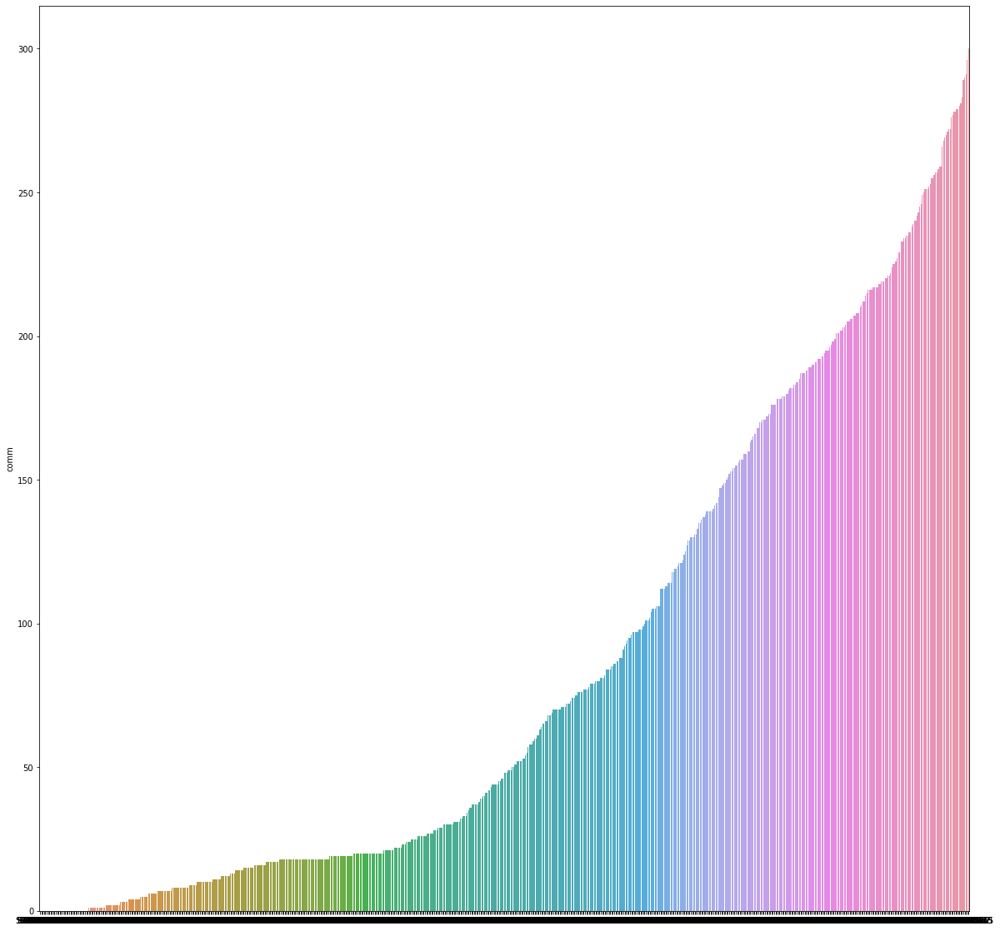

In [14]:
plt.figure(figsize=(20,20))
sns.barplot(comparesort.index,comparesort['comm'])

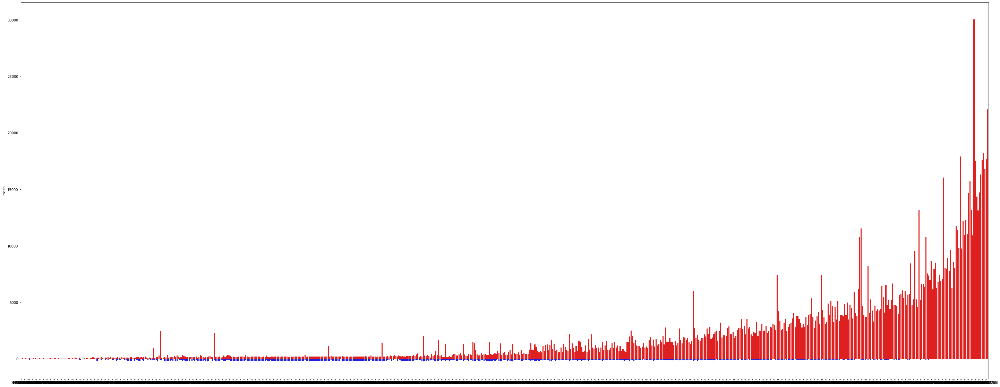

In [15]:
plt.figure(figsize=(50,20))
b = sns.barplot(comparesort.index,comparesort['rps'],color='red')
sns.barplot(comparesort.index,comparesort['mash'], color='blue')

In [16]:
comparesort['commlog'] = np.log10(comparesort['comm'] + 1)
comparesort['rpslog'] = np.log10(comparesort['rps'] + 1)
comparesort['mashlog'] = np.log10(-comparesort['mash'] + 1)
comparesort['mashlog'] = -comparesort['mashlog']
comparesort

,comm,rps,mash,commlog,rpslog,mashlog
SRR000675,0,21,-23,0.000000,1.342423,-1.380211
ERR908554,0,38,-28,0.000000,1.591065,-1.462398
SRR2227551,0,26,-1,0.000000,1.431364,-0.301030
SRR7759261,0,60,-4,0.000000,1.785330,-0.698970
SRR4289238,0,30,-19,0.000000,1.491362,-1.301030
SRR2244738,0,6,-2,0.000000,0.845098,-0.477121
ERR969484,0,72,-114,0.000000,1.863323,-2.060698
SRR2228189,0,15,-18,0.000000,1.204120,-1.278754
SRR3151662,0,30,-1,0.000000,1.491362,-0.301030
SRR926463,0,36,-9,0.000000,1.568202,-1.000000


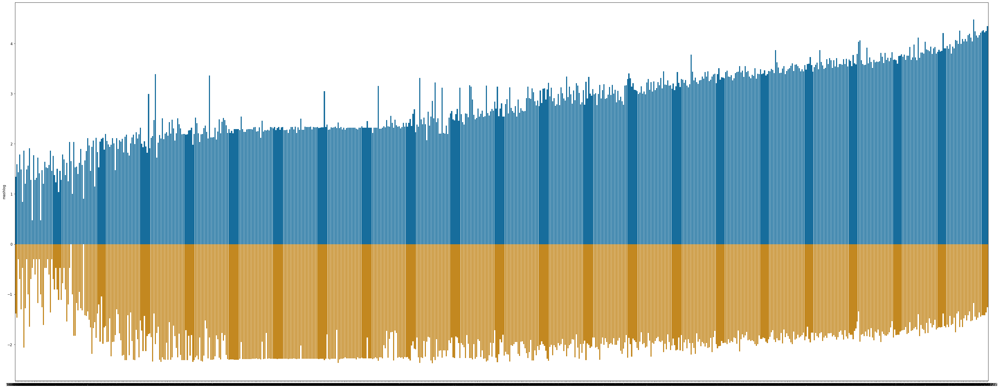

In [27]:
plt.figure(figsize=(50,20))
b = sns.barplot(comparesort.index,comparesort['rpslog'],color='#0173b2')
b = sns.barplot(comparesort.index,comparesort['mashlog'], color='#de8f05')
plt.savefig("mashvsrps.png")

In [18]:
b

['#0173b2', '#de8f05']

In [23]:
b